In [4]:
import requests
import pandas as pd

LAT, LON = 56.1629, 10.2039  # Aarhus
START, END = "2025-04-18", "2026-04-18"

# ── 1. Historical air quality (NO2, O3) ──────────────────────────────────────
print("Fetching air quality...")
aq = requests.get(
    "https://air-quality-api.open-meteo.com/v1/air-quality",
    params={
        "latitude": LAT,
        "longitude": LON,
        "hourly": "nitrogen_dioxide,ozone,pm10,pm2_5",
        "start_date": START,
        "end_date": END,
        "timezone": "Europe/Copenhagen"
    }
).json()

aq_df = pd.DataFrame({
    "Recorded": pd.to_datetime(aq["hourly"]["time"]),
    "NO2":      aq["hourly"]["nitrogen_dioxide"],
    "O3":       aq["hourly"]["ozone"],
    "PM10":     aq["hourly"]["pm10"],
    "PM2.5":    aq["hourly"]["pm2_5"],
})

# ── 2. Historical weather (wind, rain, temp, radiation) ──────────────────────
print("Fetching weather...")
wx = requests.get(
    "https://archive-api.open-meteo.com/v1/archive",
    params={
        "latitude": LAT,
        "longitude": LON,
        "hourly": "wind_speed_10m,wind_direction_10m,temperature_2m,shortwave_radiation,precipitation,relative_humidity_2m",
        "wind_speed_unit": "ms",
        "start_date": START,
        "end_date": END,
        "timezone": "Europe/Copenhagen"
    }
).json()

wx_df = pd.DataFrame({
    "Recorded":           pd.to_datetime(wx["hourly"]["time"]),
    "wind_speed":         wx["hourly"]["wind_speed_10m"],
    "temperature":        wx["hourly"]["temperature_2m"],
    "solar_radiation":    wx["hourly"]["shortwave_radiation"],
    "precipitation":      wx["hourly"]["precipitation"],
    "humidity":           wx["hourly"]["relative_humidity_2m"],

})

# ── 3. Merge and save ─────────────────────────────────────────────────────────
print("Merging...")
df = aq_df.merge(wx_df, on="Recorded", how="inner")
df = df.sort_values("Recorded").reset_index(drop=True)

print(f"\nFinal shape: {df.shape}")
print(df.head())
print(f"\nDate range: {df.Recorded.min()} → {df.Recorded.max()}")
print(f"Missing values:\n{df.isnull().sum()}")

df.to_csv("aarhus_air_quality.csv", index=False)
print("\nSaved to aarhus_air_quality.csv")

Fetching air quality...
Fetching weather...
Merging...

Final shape: (8784, 10)
             Recorded  NO2    O3  PM10  PM2.5  wind_speed  temperature  \
0 2025-04-18 00:00:00  3.4  90.0   3.8    2.9        4.52          8.3   
1 2025-04-18 01:00:00  3.1  91.0   3.2    2.6        4.51          7.9   
2 2025-04-18 02:00:00  2.5  95.0   3.0    2.1        4.40          7.8   
3 2025-04-18 03:00:00  2.7  92.0   3.1    2.0        4.44          7.8   
4 2025-04-18 04:00:00  2.6  87.0   3.4    2.6        4.70          7.8   

   solar_radiation  precipitation  humidity  
0              0.0            0.0        86  
1              0.0            0.0        87  
2              0.0            0.0        86  
3              0.0            0.0        91  
4              0.0            0.0        89  

Date range: 2025-04-18 00:00:00 → 2026-04-18 23:00:00
Missing values:
Recorded           0
NO2                0
O3                 0
PM10               0
PM2.5              0
wind_speed         0
te

In [5]:
import numpy as np 
from neuralforecast.auto import AutoNHITS
from neuralforecast.core import NeuralForecast
from neuralforecast.losses.pytorch import MAE, HuberLoss
from ray import tune # hyperparameter tuning package
#from datasetsforecast.long_horizon import LongHorizon, LongHorizonInfo
#from datasetsforecast.long_horizon2 import LongHorizon2, LongHorizon2Info
from neuralforecast.losses.pytorch import MSE
import matplotlib.pyplot as plt
import os

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-05-21 09:56:23,260	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2026-05-21 09:56:23,455	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


In [6]:
# set CPU fallback for torch when mps - apple silicon GPUs - are not supported
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

### Test with exogenous variables

In [26]:
df

,Recorded,NO2,O3,PM10,PM2.5,wind_speed,wind_direction,temperature,solar_radiation,precipitation,humidity
0,2025-04-18 00:00:00,3.4,90.0,3.8,2.9,4.52,327,8.3,0.0,0.0,86
1,2025-04-18 01:00:00,3.1,91.0,3.2,2.6,4.51,320,7.9,0.0,0.0,87
2,2025-04-18 02:00:00,2.5,95.0,3.0,2.1,4.40,326,7.8,0.0,0.0,86
3,2025-04-18 03:00:00,2.7,92.0,3.1,2.0,4.44,329,7.8,0.0,0.0,91
4,2025-04-18 04:00:00,2.6,87.0,3.4,2.6,4.70,327,7.8,0.0,0.0,89
...,...,...,...,...,...,...,...,...,...,...,...
8779,2026-04-18 19:00:00,9.9,72.0,12.1,10.4,2.17,151,9.2,47.0,0.3,92
8780,2026-04-18 20:00:00,10.7,67.0,11.6,10.4,1.90,166,9.3,20.0,0.2,93
8781,2026-04-18 21:00:00,11.6,58.0,11.5,10.4,1.96,176,9.1,1.0,0.1,94
8782,2026-04-18 22:00:00,10.7,51.0,11.7,10.6,2.08,207,9.1,0.0,0.0,95


In [27]:
df['unique_id'] = '1'

In [28]:
df = df.rename(columns={'Recorded': 'ds', 'NO2': 'y'})

In [30]:
exg_columns = ['wind_speed', 'wind_direction', 'temperature', 'solar_radiation', 'precipitation', 'humidity']

In [ ]:
models = [AutoNHITS(h = horizon,
                    futr_exog_list=exg_columns
)]

In [7]:
import logging
logging.getLogger("pytorch_lightning").setLevel(logging.ERROR)
logging.getLogger("ray").setLevel(logging.ERROR)
logging.getLogger("ray.tune").setLevel(logging.ERROR)

In [38]:
from tqdm import tqdm

### Test of workflow

In [15]:
def run_model_test(particle, exog_variables, nhits_config, df_train, step_size, w_size):

    # ── Config ────────────────────────────────────────────────────────────────────
    horizon = 96          # forecast 96 hours ahead
    num_samples = 5       # number of Ray Tune trials (5 times, it randomly selects a combination of these values)

    if exog_variables:
        nhits_config["futr_exog_list"] = tune.choice([exog_variables])
    
    df = df_train.rename(columns={'Recorded': 'ds', f'{particle}': 'y'})
    df['unique_id'] = particle

    particle_df = df[['ds', 'unique_id', 'y', 'wind_speed', 'temperature']]

    model = AutoNHITS(
    h=horizon,
    loss=MSE(),
    valid_loss=MAE(),
    config=nhits_config,
    num_samples=num_samples,
    refit_with_val=True
    )

    nf = NeuralForecast(models=[model], freq="h")

    #initial = int(len(particle_df) * (2/3))
    #step = 168
    #n_windows = (len(particle_df) - initial) // step

    cv_df = nf.cross_validation(df=particle_df, n_windows=w_size,
                            step_size=step_size, refit=False, verbose=False)


    mae = np.mean(np.abs(cv_df["AutoNHITS"] - cv_df["y"]))
    mse = np.mean((cv_df["AutoNHITS"] - cv_df["y"]) ** 2)
    rmse = np.sqrt(mse)
    print(f"RMSE: {rmse:.4f}")

    cutoffs = cv_df["cutoff"].unique()

    fig, axes = plt.subplots(len(cutoffs), 1, figsize=(14, 4 * len(cutoffs)))

    for ax, cutoff in zip(axes, cutoffs):
        window_df = cv_df[cv_df["cutoff"] == cutoff].copy()
        
        # Plot a bit of training context before the cutoff
        context_df = particle_df[particle_df["ds"] > cutoff - pd.Timedelta(hours=horizon*2)]
        context_df = context_df[context_df["ds"] <= cutoff]
        
        ax.plot(context_df["ds"], context_df["y"], 
                color="steelblue", label="Historical")
        ax.plot(window_df["ds"], window_df["y"], 
                color="steelblue", linestyle="--", alpha=0.5, label="Ground truth")
        ax.plot(window_df["ds"], window_df["AutoNHITS"], 
                color="tomato", linestyle="--", label="AutoNHITS forecast")
        ax.axvline(x=cutoff, color="black", linestyle=":", label="Cutoff")
        
        window_mae = np.mean(np.abs(window_df["AutoNHITS"] - window_df["y"]))
        ax.set_title(f"Cutoff: {cutoff}  |  MAE: {window_mae:.4f}")
        ax.set_xlabel("Time")
        ax.set_ylabel("NO2")
        ax.legend()

    plt.suptitle(f"AutoNHITS CV Results  |  Overall MAE: {mae:.4f}  |  MSE: {mse:.4f}", 
                fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

    best_config = nf.models[0].results.get_best_result().config

    return best_config

In [9]:
test_size = 96
train_df = df.iloc[:-test_size]
test_df  = df.iloc[-test_size:]

(_train_tune pid=27150) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27150) Seed set to 7
(_train_tune pid=27150) GPU available: True (mps), used: True
(_train_tune pid=27150) TPU available: False, using: 0 TPU cores
(_train_tune pid=27150) 
(_train_tune pid=27150)   | Name         | Type          | Params | Mode 
(_train_tune pid=27150) -------------------------------------------------------
(_train_tune pid=27150) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27150) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27150) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27150) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27150)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 21.73it/s, v_num=0, train_loss_step=131.0, train_loss_epoch=131.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 25.64it/s, v_num=0, train_loss_step=92.90, train_loss_epoch=82.20, valid_loss=11.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 24.09it/s, v_num=0, train_loss_step=52.20, train_loss_epoch=51.80, valid_loss=9.510]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 28.88it/s, v_num=0, train_loss_step=38.40, train_loss_epoch=39.30, valid_loss=10.90]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 27.78it/s, v_num=0, train_loss

(_train_tune pid=27150) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27168) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27168) Seed set to 9
(_train_tune pid=27168) GPU available: True (mps), used: True
(_train_tune pid=27168) TPU available: False, using: 0 TPU cores
(_train_tune pid=27168) 
(_train_tune pid=27168)   | Name         | Type          | Params | Mode 
(_train_tune pid=27168) -------------------------------------------------------
(_train_tune pid=27168) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27168) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27168) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27168) 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 29.31it/s, v_num=0, train_loss_step=143.0, train_loss_epoch=138.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 27.14it/s, v_num=0, train_loss_step=102.0, train_loss_epoch=107.0, valid_loss=14.40]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.92it/s, v_num=0, train_loss_step=76.10, train_loss_epoch=80.60, valid_loss=13.40]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 26.68it/s, v_num=0, train_loss_step=66.80, train_loss_epoch=66.20, valid_loss=13.40]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 23.86it/s, v_num=0, train_loss

(_train_tune pid=27168) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27197) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27197) Seed set to 3
(_train_tune pid=27197) GPU available: True (mps), used: True
(_train_tune pid=27197) TPU available: False, using: 0 TPU cores
(_train_tune pid=27197) 
(_train_tune pid=27197)   | Name         | Type          | Params | Mode 
(_train_tune pid=27197) -------------------------------------------------------
(_train_tune pid=27197) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27197) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27197) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27197) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 29.59it/s, v_num=0, train_loss_step=320.0, train_loss_epoch=296.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 122.65it/s]
(_train_tune pid=27197) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 26.16it/s, v_num=0, train_loss_step=349.0, train_loss_epoch=308.0, valid_loss=10.20]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=27197) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 23.09it/s, v_num=0, train_loss_step=348.0, train_loss_epoch=317.0, valid_loss=10.20]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 22.96it/s, v_num=0, train_loss_step=274.0, train_loss_epoch=287.0, valid_loss=10.20]
Validation: |          | 0/? [00:0

(_train_tune pid=27197) `Trainer.fit` stopped: `max_steps=2000` reached.


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 29.67it/s, v_num=0, train_loss_step=320.0, train_loss_epoch=289.0, valid_loss=10.30]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 18.39it/s, v_num=0, train_loss_step=320.0, train_loss_epoch=320.0, valid_loss=10.30]


(_train_tune pid=27224) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27224) Seed set to 3
(_train_tune pid=27224) GPU available: True (mps), used: True
(_train_tune pid=27224) TPU available: False, using: 0 TPU cores
(_train_tune pid=27224) 
(_train_tune pid=27224)   | Name         | Type          | Params | Mode 
(_train_tune pid=27224) -------------------------------------------------------
(_train_tune pid=27224) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27224) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27224) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27224) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27224)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 26.63it/s, v_num=0, train_loss_step=122.0, train_loss_epoch=120.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 29.45it/s, v_num=0, train_loss_step=84.20, train_loss_epoch=93.10, valid_loss=12.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 27.97it/s, v_num=0, train_loss_step=54.20, train_loss_epoch=54.60, valid_loss=10.60]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 27.46it/s, v_num=0, train_loss_step=39.70, train_loss_epoch=37.00, valid_loss=9.740]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 24.87it/s, v_num=0, train_loss

(_train_tune pid=27224) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27245) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27245) Seed set to 3
(_train_tune pid=27245) GPU available: True (mps), used: True
(_train_tune pid=27245) TPU available: False, using: 0 TPU cores


Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=27245) 
(_train_tune pid=27245)   | Name         | Type          | Params | Mode 
(_train_tune pid=27245) -------------------------------------------------------
(_train_tune pid=27245) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27245) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27245) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27245) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27245) 4 | blocks       | ModuleList    | 10.0 M | train
(_train_tune pid=27245) -------------------------------------------------------
(_train_tune pid=27245) 10.0 M    Trainable params
(_train_tune pid=27245) 0         Non-trainable params
(_train_tune pid=27245) 10.0 M    Total params
(_train_tune pid=27245) 40.006    Total estimated model params size (MB)
(_train_tune pid=27245) 122       Modules in train mode
(_train_tune pid=27245) 0         Modules in eval mode
(_train_tune pid=27245) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 25.15it/s, v_num=0, train_loss_step=175.0, train_loss_epoch=200.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=27245) 
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 108.56it/s]
(_train_tune pid=27245) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 28.49it/s, v_num=0, train_loss_step=175.0, train_loss_epoch=162.0, valid_loss=10.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 115.10it/s]
(_train_tune pid=27245) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 28.20it/s, v_num=0, train_loss_step=374.0, train_loss_epoch=369.0, valid_loss=10.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 121.45it

(_train_tune pid=27245) `Trainer.fit` stopped: `max_steps=2000` reached.
2026-05-21 09:48:18,042	INFO tune.py:1001 -- Wrote the latest version of all result files and experiment state to '/Users/louisebrixpilegaardhansen/ray_results/_train_tune_2026-05-21_09-40-18' in 0.0055s.
Seed set to 3
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 23.17it/s, v_num=0, train_loss_step=162.0, train_loss_epoch=150.0, valid_loss=10.50]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s, v_num=0, train_loss_step=162.0, train_loss_epoch=162.0, valid_loss=10.60]



  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | eval 
1 | valid_loss   | MAE           | 0      | eval 
2 | padder_train | ConstantPad1d | 0      | train
3 | scaler       | TemporalNorm  | 0      | train
4 | blocks       | ModuleList    | 10.0 M | train
-------------------------------------------------------
10.0 M    Trainable params
0         Non-trainable params
10.0 M    Total params
40.006    Total estimated model params size (MB)
120       Modules in train mode
2         Modules in eval mode


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 15.55it/s, v_num=8, train_loss_step=320.0, train_loss_epoch=320.0, valid_loss=10.30]    

`Trainer.fit` stopped: `max_steps=2000` reached.


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 14.74it/s, v_num=8, train_loss_step=320.0, train_loss_epoch=320.0, valid_loss=10.30]


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]
RMSE: 18.0348


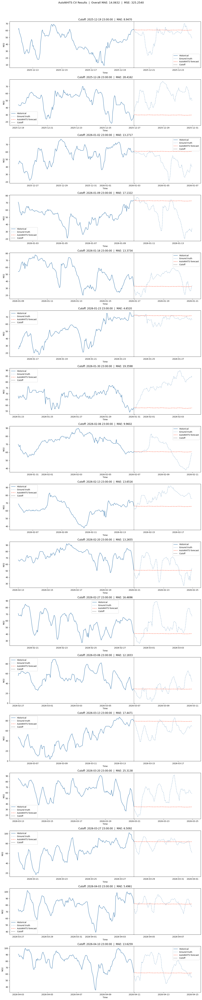

In [ ]:
best_config = run_model_test('O3', ['temperature', 'wind_speed'], train_df) # w. w_size=17, step_size= 1 week. = shits

(_train_tune pid=27549) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27549) Seed set to 7
(_train_tune pid=27549) GPU available: True (mps), used: True
(_train_tune pid=27549) TPU available: False, using: 0 TPU cores
(_train_tune pid=27549) 
(_train_tune pid=27549)   | Name         | Type          | Params | Mode 
(_train_tune pid=27549) -------------------------------------------------------
(_train_tune pid=27549) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27549) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27549) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27549) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27549)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 22.87it/s, v_num=0, train_loss_step=139.0, train_loss_epoch=146.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 29.81it/s, v_num=0, train_loss_step=86.70, train_loss_epoch=86.20, valid_loss=9.880]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.73it/s, v_num=0, train_loss_step=55.10, train_loss_epoch=50.70, valid_loss=13.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.55it/s, v_num=0, train_loss_step=38.30, train_loss_epoch=40.50, valid_loss=10.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 104.46it/s]
(_tr

(_train_tune pid=27549) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27573) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27573) Seed set to 9
(_train_tune pid=27573) GPU available: True (mps), used: True
(_train_tune pid=27573) TPU available: False, using: 0 TPU cores
(_train_tune pid=27573) 
(_train_tune pid=27573)   | Name         | Type          | Params | Mode 
(_train_tune pid=27573) -------------------------------------------------------
(_train_tune pid=27573) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27573) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27573) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27573) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 20.45it/s, v_num=0, train_loss_step=140.0, train_loss_epoch=144.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=27573) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 29.26it/s, v_num=0, train_loss_step=113.0, train_loss_epoch=113.0, valid_loss=8.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 29.71it/s, v_num=0, train_loss_step=83.50, train_loss_epoch=84.90, valid_loss=10.90]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 19.94it/s, v_num=0, train_loss_step=66.90, train_loss_epoch=73.30, valid_loss=10.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<

(_train_tune pid=27573) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27607) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27607) Seed set to 3
(_train_tune pid=27607) GPU available: True (mps), used: True
(_train_tune pid=27607) TPU available: False, using: 0 TPU cores


Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=27607) 
(_train_tune pid=27607)   | Name         | Type          | Params | Mode 
(_train_tune pid=27607) -------------------------------------------------------
(_train_tune pid=27607) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27607) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27607) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27607) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27607) 4 | blocks       | ModuleList    | 10.0 M | train
(_train_tune pid=27607) -------------------------------------------------------
(_train_tune pid=27607) 10.0 M    Trainable params
(_train_tune pid=27607) 0         Non-trainable params
(_train_tune pid=27607) 10.0 M    Total params
(_train_tune pid=27607) 40.006    Total estimated model params size (MB)
(_train_tune pid=27607) 122       Modules in train mode
(_train_tune pid=27607) 0         Modules in eval mode
(_train_tune pid=27607) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 27.32it/s, v_num=0, train_loss_step=1.02e+4, train_loss_epoch=5.16e+3]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 26.87it/s, v_num=0, train_loss_step=6.32e+3, train_loss_epoch=3.99e+3, valid_loss=15.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.98it/s, v_num=0, train_loss_step=775.0, train_loss_epoch=636.0, valid_loss=33.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 24.22it/s, v_num=0, train_loss_step=604.0, train_loss_epoch=719.0, valid_loss=10.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 25.20it/s, v_num=0, train_loss_step=1.33e+3, train_loss_epoch=571.0, vali

(_train_tune pid=27607) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27646) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27646) Seed set to 3
(_train_tune pid=27646) GPU available: True (mps), used: True
(_train_tune pid=27646) TPU available: False, using: 0 TPU cores
(_train_tune pid=27646) 
(_train_tune pid=27646)   | Name         | Type          | Params | Mode 
(_train_tune pid=27646) -------------------------------------------------------
(_train_tune pid=27646) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27646) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27646) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27646) 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 19.48it/s, v_num=0, train_loss_step=126.0, train_loss_epoch=115.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 27.68it/s, v_num=0, train_loss_step=102.0, train_loss_epoch=87.80, valid_loss=7.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.39it/s, v_num=0, train_loss_step=52.80, train_loss_epoch=51.70, valid_loss=10.60]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 27.27it/s, v_num=0, train_loss_step=37.70, train_loss_epoch=36.30, valid_loss=13.50]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 26.89it/s, v_num=0, train_loss

(_train_tune pid=27646) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27663) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27663) Seed set to 3
(_train_tune pid=27663) GPU available: True (mps), used: True
(_train_tune pid=27663) TPU available: False, using: 0 TPU cores


Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=27663) 
(_train_tune pid=27663)   | Name         | Type          | Params | Mode 
(_train_tune pid=27663) -------------------------------------------------------
(_train_tune pid=27663) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27663) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27663) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27663) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27663) 4 | blocks       | ModuleList    | 10.0 M | train
(_train_tune pid=27663) -------------------------------------------------------
(_train_tune pid=27663) 10.0 M    Trainable params
(_train_tune pid=27663) 0         Non-trainable params
(_train_tune pid=27663) 10.0 M    Total params
(_train_tune pid=27663) 40.006    Total estimated model params size (MB)
(_train_tune pid=27663) 122       Modules in train mode
(_train_tune pid=27663) 0         Modules in eval mode
(_train_tune pid=27663) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 19.68it/s, v_num=0, train_loss_step=377.0, train_loss_epoch=236.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 26.12it/s, v_num=0, train_loss_step=184.0, train_loss_epoch=180.0, valid_loss=8.440]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.11it/s, v_num=0, train_loss_step=141.0, train_loss_epoch=134.0, valid_loss=7.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 23.92it/s, v_num=0, train_loss_step=2.07e+5, train_loss_epoch=2.06e+5, valid_loss=6.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 116.71it/s]
(_train_tune pid=27663) 
Epoch 499: 100%|██████████

(_train_tune pid=27663) `Trainer.fit` stopped: `max_steps=2000` reached.
Seed set to 7


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 25.26it/s, v_num=0, train_loss_step=312.0, train_loss_epoch=288.0, valid_loss=12.20]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 16.64it/s, v_num=0, train_loss_step=312.0, train_loss_epoch=312.0, valid_loss=12.20]
Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]
RMSE: 14.4261


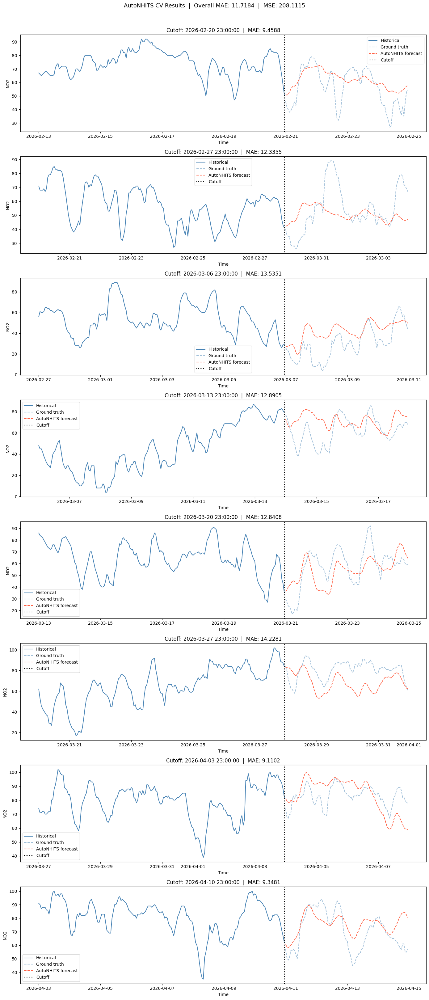

In [10]:
best_config = run_model_test('O3', ['temperature', 'wind_speed'], train_df, step_size=168, w_size=8)

(_train_tune pid=27759) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27759) Seed set to 7
(_train_tune pid=27759) GPU available: True (mps), used: True
(_train_tune pid=27759) TPU available: False, using: 0 TPU cores
(_train_tune pid=27759) 
(_train_tune pid=27759)   | Name         | Type          | Params | Mode 
(_train_tune pid=27759) -------------------------------------------------------
(_train_tune pid=27759) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27759) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27759) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27759) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27759)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 27.61it/s, v_num=0, train_loss_step=164.0, train_loss_epoch=148.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 109.10it/s]
(_train_tune pid=27759) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 21.07it/s, v_num=0, train_loss_step=83.90, train_loss_epoch=83.10, valid_loss=18.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.17it/s, v_num=0, train_loss_step=56.40, train_loss_epoch=58.30, valid_loss=19.30]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 24.60it/s, v_num=0, train_loss_step=38.80, train_loss_epoch=42.10, valid_loss=21.00]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 

(_train_tune pid=27759) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27806) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27806) Seed set to 9
(_train_tune pid=27806) GPU available: True (mps), used: True
(_train_tune pid=27806) TPU available: False, using: 0 TPU cores
(_train_tune pid=27806) 
(_train_tune pid=27806)   | Name         | Type          | Params | Mode 
(_train_tune pid=27806) -------------------------------------------------------
(_train_tune pid=27806) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27806) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27806) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27806) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 26.12it/s, v_num=0, train_loss_step=141.0, train_loss_epoch=146.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 25.72it/s, v_num=0, train_loss_step=113.0, train_loss_epoch=118.0, valid_loss=17.90]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.73it/s, v_num=0, train_loss_step=91.90, train_loss_epoch=93.20, valid_loss=16.20]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 28.63it/s, v_num=0, train_loss_step=78.90, train_loss_epoch=82.30, valid_loss=21.20]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 120.78it/s]
(_train_tune pid=27806) 
Epoch 499: 100%|██████████| 1/

(_train_tune pid=27806) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27834) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27834) Seed set to 3
(_train_tune pid=27834) GPU available: True (mps), used: True
(_train_tune pid=27834) TPU available: False, using: 0 TPU cores
(_train_tune pid=27834) 
(_train_tune pid=27834)   | Name         | Type          | Params | Mode 
(_train_tune pid=27834) -------------------------------------------------------
(_train_tune pid=27834) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27834) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27834) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27834) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 23.94it/s, v_num=0, train_loss_step=1.48e+3, train_loss_epoch=1.65e+3]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 30.53it/s, v_num=0, train_loss_step=651.0, train_loss_epoch=539.0, valid_loss=41.40]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 27.49it/s, v_num=0, train_loss_step=491.0, train_loss_epoch=489.0, valid_loss=36.50]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 27.27it/s, v_num=0, train_loss_step=387.0, train_loss_epoch=390.0, valid_loss=37.80]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 120.70it/s]
(_train_tune pid=27834) 
Epoch 499: 100%|██████████

(_train_tune pid=27834) `Trainer.fit` stopped: `max_steps=2000` reached.


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 29.35it/s, v_num=0, train_loss_step=314.0, train_loss_epoch=295.0, valid_loss=36.00]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 18.09it/s, v_num=0, train_loss_step=314.0, train_loss_epoch=314.0, valid_loss=36.10]


(_train_tune pid=27858) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27858) Seed set to 3
(_train_tune pid=27858) GPU available: True (mps), used: True
(_train_tune pid=27858) TPU available: False, using: 0 TPU cores
(_train_tune pid=27858) 
(_train_tune pid=27858)   | Name         | Type          | Params | Mode 
(_train_tune pid=27858) -------------------------------------------------------
(_train_tune pid=27858) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27858) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27858) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27858) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=27858)

Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=27858) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 24.99it/s, v_num=0, train_loss_step=143.0, train_loss_epoch=132.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 29.29it/s, v_num=0, train_loss_step=101.0, train_loss_epoch=83.10, valid_loss=18.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 28.93it/s, v_num=0, train_loss_step=58.50, train_loss_epoch=53.80, valid_loss=24.40]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 29.00it/s, v_num=0, train_loss_step=40.30, train_loss_epoch=40.10, valid_loss=25.00]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 24.88it/s, v_num=0, train_loss_step=30.90, train_loss_epoch=28.70, valid_loss=24.

(_train_tune pid=27858) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=27910) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=27910) Seed set to 3
(_train_tune pid=27910) GPU available: True (mps), used: True
(_train_tune pid=27910) TPU available: False, using: 0 TPU cores
(_train_tune pid=27910) 
(_train_tune pid=27910)   | Name         | Type          | Params | Mode 
(_train_tune pid=27910) -------------------------------------------------------
(_train_tune pid=27910) 0 | loss         | MSE           | 0      | train
(_train_tune pid=27910) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=27910) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=27910) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 24.70it/s, v_num=0, train_loss_step=261.0, train_loss_epoch=238.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 25.77it/s, v_num=0, train_loss_step=195.0, train_loss_epoch=198.0, valid_loss=31.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 22.55it/s, v_num=0, train_loss_step=164.0, train_loss_epoch=154.0, valid_loss=21.30]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 121.60it/s]
(_train_tune pid=27910) 
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.10it/s, v_num=0, train_loss_step=140.0, train_loss_epoch=146.0, valid_loss=20.80]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/

(_train_tune pid=27910) `Trainer.fit` stopped: `max_steps=2000` reached.
Seed set to 3


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 24.62it/s, v_num=0, train_loss_step=317.0, train_loss_epoch=292.0, valid_loss=35.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 15.96it/s, v_num=0, train_loss_step=317.0, train_loss_epoch=317.0, valid_loss=35.70]
                                                                           

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 31.77it/s]
RMSE: 13.9841


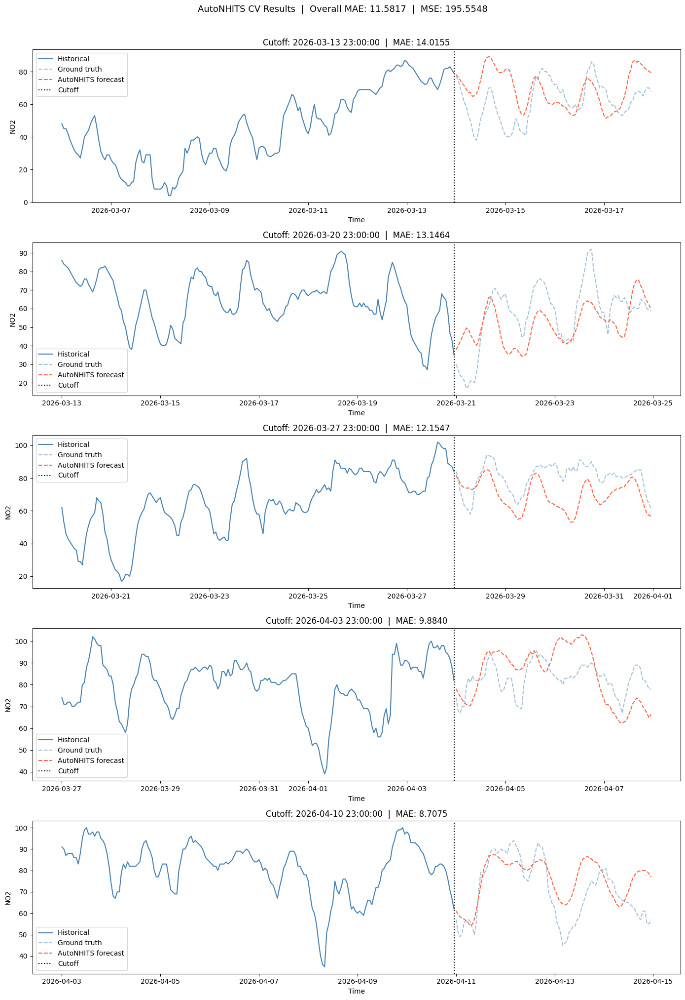

In [11]:
best_config = run_model_test('O3', ['temperature', 'wind_speed'], train_df, step_size=168, w_size=5)

(_train_tune pid=28035) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=28035) Seed set to 7
(_train_tune pid=28035) GPU available: True (mps), used: True
(_train_tune pid=28035) TPU available: False, using: 0 TPU cores
(_train_tune pid=28035) 
(_train_tune pid=28035)   | Name         | Type          | Params | Mode 
(_train_tune pid=28035) -------------------------------------------------------
(_train_tune pid=28035) 0 | loss         | MSE           | 0      | train
(_train_tune pid=28035) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=28035) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=28035) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=28035)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 25.17it/s, v_num=0, train_loss_step=139.0, train_loss_epoch=170.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 24.35it/s, v_num=0, train_loss_step=87.20, train_loss_epoch=89.20, valid_loss=8.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.48it/s, v_num=0, train_loss_step=58.80, train_loss_epoch=57.20, valid_loss=6.140]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.00it/s, v_num=0, train_loss_step=43.60, train_loss_epoch=42.80, valid_loss=6.780]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 23.01it/s, v_num=0, train_loss

(_train_tune pid=28035) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=28097) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=28097) Seed set to 9
(_train_tune pid=28097) GPU available: True (mps), used: True
(_train_tune pid=28097) TPU available: False, using: 0 TPU cores
(_train_tune pid=28097) 
(_train_tune pid=28097)   | Name         | Type          | Params | Mode 
(_train_tune pid=28097) -------------------------------------------------------
(_train_tune pid=28097) 0 | loss         | MSE           | 0      | train
(_train_tune pid=28097) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=28097) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=28097) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 23.62it/s, v_num=0, train_loss_step=149.0, train_loss_epoch=147.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 24.71it/s, v_num=0, train_loss_step=115.0, train_loss_epoch=118.0, valid_loss=8.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 19.49it/s, v_num=0, train_loss_step=92.00, train_loss_epoch=92.10, valid_loss=7.050]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 26.63it/s, v_num=0, train_loss_step=90.60, train_loss_epoch=89.10, valid_loss=6.760]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=28097) 
Epoch 499: 100%|██████████| 1/1 [00:00<

(_train_tune pid=28097) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=28170) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=28170) Seed set to 3
(_train_tune pid=28170) GPU available: True (mps), used: True
(_train_tune pid=28170) TPU available: False, using: 0 TPU cores
(_train_tune pid=28170) 
(_train_tune pid=28170)   | Name         | Type          | Params | Mode 
(_train_tune pid=28170) -------------------------------------------------------
(_train_tune pid=28170) 0 | loss         | MSE           | 0      | train
(_train_tune pid=28170) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=28170) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=28170) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 26.10it/s, v_num=0, train_loss_step=474.0, train_loss_epoch=416.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 23.16it/s, v_num=0, train_loss_step=392.0, train_loss_epoch=380.0, valid_loss=11.20]
(_train_tune pid=28170) 
Validation: |          | 0/? [00:00<?, ?it/s]
(_train_tune pid=28170) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=28170) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.77it/s, v_num=0, train_loss_step=404.0, train_loss_epoch=346.0, valid_loss=10.60]
(_train_tune pid=28170) 
Validation: |          | 0/? [00:00<?, ?it/s]
(_train_tune pid=28170) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=28170) 
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 27.04it/s, v_num=0, train_lo

(_train_tune pid=28170) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=28270) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=28270) Seed set to 3
(_train_tune pid=28270) GPU available: True (mps), used: True
(_train_tune pid=28270) TPU available: False, using: 0 TPU cores


Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=28270) 
(_train_tune pid=28270)   | Name         | Type          | Params | Mode 
(_train_tune pid=28270) -------------------------------------------------------
(_train_tune pid=28270) 0 | loss         | MSE           | 0      | train
(_train_tune pid=28270) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=28270) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=28270) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=28270) 4 | blocks       | ModuleList    | 10.0 M | train
(_train_tune pid=28270) -------------------------------------------------------
(_train_tune pid=28270) 10.0 M    Trainable params
(_train_tune pid=28270) 0         Non-trainable params
(_train_tune pid=28270) 10.0 M    Total params
(_train_tune pid=28270) 40.006    Total estimated model params size (MB)
(_train_tune pid=28270) 122       Modules in train mode
(_train_tune pid=28270) 0         Modules in eval mode
(_train_tune pid=28270) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 26.32it/s, v_num=0, train_loss_step=139.0, train_loss_epoch=134.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 20.81it/s, v_num=0, train_loss_step=99.40, train_loss_epoch=86.20, valid_loss=7.880]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.03it/s, v_num=0, train_loss_step=53.30, train_loss_epoch=53.30, valid_loss=7.070]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 29.06it/s, v_num=0, train_loss_step=40.80, train_loss_epoch=39.80, valid_loss=8.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 22.30it/s, v_num=0, train_loss_step=30.90, train_loss_epoch=30.20, valid_loss=7.2

(_train_tune pid=28270) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=28299) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=28299) Seed set to 3
(_train_tune pid=28299) GPU available: True (mps), used: True
(_train_tune pid=28299) TPU available: False, using: 0 TPU cores
(_train_tune pid=28299) 
(_train_tune pid=28299)   | Name         | Type          | Params | Mode 
(_train_tune pid=28299) -------------------------------------------------------
(_train_tune pid=28299) 0 | loss         | MSE           | 0      | train
(_train_tune pid=28299) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=28299) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=28299) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 28.15it/s, v_num=0, train_loss_step=326.0, train_loss_epoch=311.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 28.74it/s, v_num=0, train_loss_step=345.0, train_loss_epoch=434.0, valid_loss=10.20]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 29.74it/s, v_num=0, train_loss_step=376.0, train_loss_epoch=319.0, valid_loss=10.90]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 27.35it/s, v_num=0, train_loss_step=250.0, train_loss_epoch=277.0, valid_loss=10.30]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 115.10it/s]
(_train_tune pid=28299) 
Epoch 499: 100%|██████████| 1/

(_train_tune pid=28299) `Trainer.fit` stopped: `max_steps=2000` reached.
Seed set to 3


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 26.30it/s, v_num=0, train_loss_step=115.0, train_loss_epoch=119.0, valid_loss=8.970]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 16.63it/s, v_num=0, train_loss_step=115.0, train_loss_epoch=115.0, valid_loss=9.100]
                                                                           

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 105.81it/s]
RMSE: 11.7903


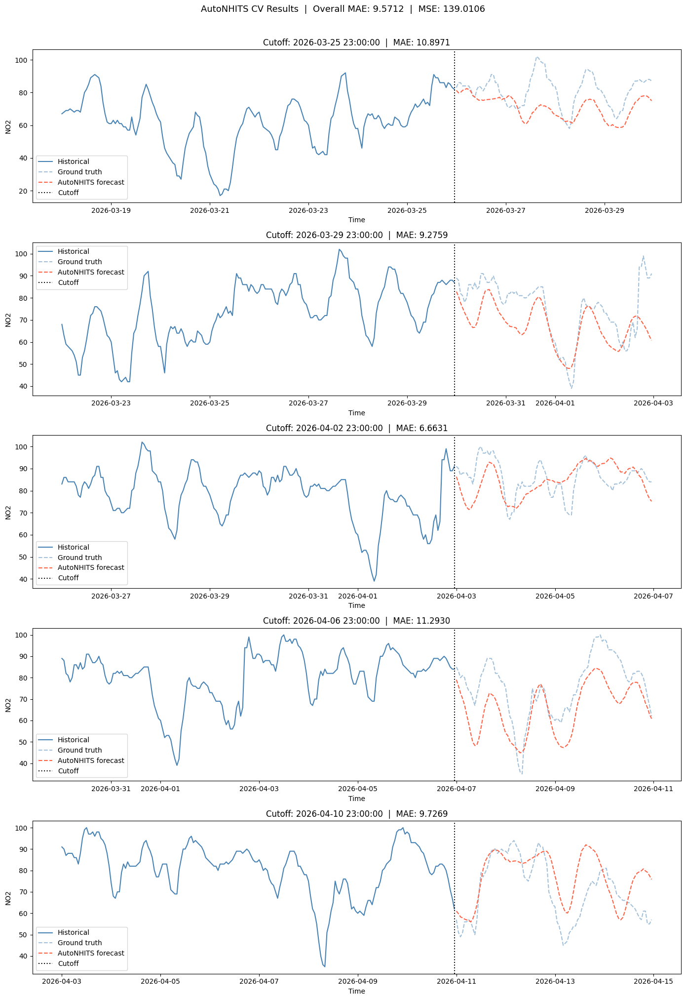

In [12]:
best_config = run_model_test('O3', ['temperature', 'wind_speed'], train_df, step_size=96, w_size=5)

(_train_tune pid=28976) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=28976) Seed set to 7
(_train_tune pid=28976) GPU available: True (mps), used: True
(_train_tune pid=28976) TPU available: False, using: 0 TPU cores
(_train_tune pid=28976) 
(_train_tune pid=28976)   | Name         | Type          | Params | Mode 
(_train_tune pid=28976) -------------------------------------------------------
(_train_tune pid=28976) 0 | loss         | MSE           | 0      | train
(_train_tune pid=28976) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=28976) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=28976) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=28976)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 30.54it/s, v_num=0, train_loss_step=9.110, train_loss_epoch=8.500]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 32.39it/s, v_num=0, train_loss_step=3.990, train_loss_epoch=4.310, valid_loss=3.820]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=28976) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 31.50it/s, v_num=0, train_loss_step=2.590, train_loss_epoch=2.590, valid_loss=3.420]
(_train_tune pid=28976) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 31.70it/s, v_num=0, train_loss_step=2.060, train_loss_epoch=1.960, valid_loss=3.440]
Validation: |          | 0/? [00:00<?, ?it/s]
Validatio

(_train_tune pid=28976) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29044) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29044) Seed set to 9
(_train_tune pid=29044) GPU available: True (mps), used: True
(_train_tune pid=29044) TPU available: False, using: 0 TPU cores
(_train_tune pid=29044) 
(_train_tune pid=29044)   | Name         | Type          | Params | Mode 
(_train_tune pid=29044) -------------------------------------------------------
(_train_tune pid=29044) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29044) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29044) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29044) 

Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=29044) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 31.70it/s, v_num=0, train_loss_step=8.900, train_loss_epoch=11.00]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 115.46it/s]
                                                                       
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 29.74it/s, v_num=0, train_loss_step=6.000, train_loss_epoch=6.250, valid_loss=3.480]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 29.63it/s, v_num=0, train_loss_step=4.270, train_loss_epoch=4.530, valid_loss=3.530]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 118.63it/s]
(_train_tune pid=29044) 
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 31.25it/s, v_num=0, train_loss_step=3.460, train_loss_epoch=3.5

(_train_tune pid=29044) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29121) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29121) Seed set to 3
(_train_tune pid=29121) GPU available: True (mps), used: True
(_train_tune pid=29121) TPU available: False, using: 0 TPU cores
(_train_tune pid=29121) 
(_train_tune pid=29121)   | Name         | Type          | Params | Mode 
(_train_tune pid=29121) -------------------------------------------------------
(_train_tune pid=29121) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29121) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29121) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29121) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 30.38it/s, v_num=0, train_loss_step=320.0, train_loss_epoch=284.0]
(_train_tune pid=29121) 
Validation: |          | 0/? [00:00<?, ?it/s]
(_train_tune pid=29121) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29121) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 28.89it/s, v_num=0, train_loss_step=88.50, train_loss_epoch=99.10, valid_loss=5.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29121) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 31.49it/s, v_num=0, train_loss_step=70.80, train_loss_epoch=63.40, valid_loss=5.930]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 31.01it/s, v_num=0, train_loss_step=31.10, train_loss_epoch=35.00, valid_loss=

(_train_tune pid=29121) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29180) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29180) Seed set to 3
(_train_tune pid=29180) GPU available: True (mps), used: True
(_train_tune pid=29180) TPU available: False, using: 0 TPU cores
(_train_tune pid=29180) 
(_train_tune pid=29180)   | Name         | Type          | Params | Mode 
(_train_tune pid=29180) -------------------------------------------------------
(_train_tune pid=29180) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29180) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29180) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29180) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 29.87it/s, v_num=0, train_loss_step=7.280, train_loss_epoch=7.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 30.66it/s, v_num=0, train_loss_step=4.040, train_loss_epoch=4.230, valid_loss=4.110]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 32.93it/s, v_num=0, train_loss_step=2.770, train_loss_epoch=2.340, valid_loss=3.430]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 31.74it/s, v_num=0, train_loss_step=2.170, train_loss_epoch=1.890, valid_loss=3.500]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 32.37it/s, v_num=0, train_loss_step=1.640, train_loss_epoch=1.600, valid_loss=3.4

(_train_tune pid=29180) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29282) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29282) Seed set to 3
(_train_tune pid=29282) GPU available: True (mps), used: True
(_train_tune pid=29282) TPU available: False, using: 0 TPU cores


Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=29282) 
(_train_tune pid=29282)   | Name         | Type          | Params | Mode 
(_train_tune pid=29282) -------------------------------------------------------
(_train_tune pid=29282) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29282) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29282) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29282) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=29282) 4 | blocks       | ModuleList    | 10.0 M | train
(_train_tune pid=29282) -------------------------------------------------------
(_train_tune pid=29282) 10.0 M    Trainable params
(_train_tune pid=29282) 0         Non-trainable params
(_train_tune pid=29282) 10.0 M    Total params
(_train_tune pid=29282) 40.006    Total estimated model params size (MB)
(_train_tune pid=29282) 122       Modules in train mode
(_train_tune pid=29282) 0         Modules in eval mode
(_train_tune pid=29282) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 28.84it/s, v_num=0, train_loss_step=19.50, train_loss_epoch=17.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 98.03it/s]
(_train_tune pid=29282) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 26.16it/s, v_num=0, train_loss_step=15.30, train_loss_epoch=15.80, valid_loss=4.960]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 30.54it/s, v_num=0, train_loss_step=25.20, train_loss_epoch=20.60, valid_loss=4.730]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 30.53it/s, v_num=0, train_loss_step=15.50, train_loss_epoch=15.30, valid_loss=5.440]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|█

(_train_tune pid=29282) `Trainer.fit` stopped: `max_steps=2000` reached.
Seed set to 7


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 26.76it/s, v_num=0, train_loss_step=3.860, train_loss_epoch=5.070, valid_loss=4.500]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 17.07it/s, v_num=0, train_loss_step=3.860, train_loss_epoch=3.860, valid_loss=4.470]
                                                                           

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 105.61it/s]
RMSE: 2.5640


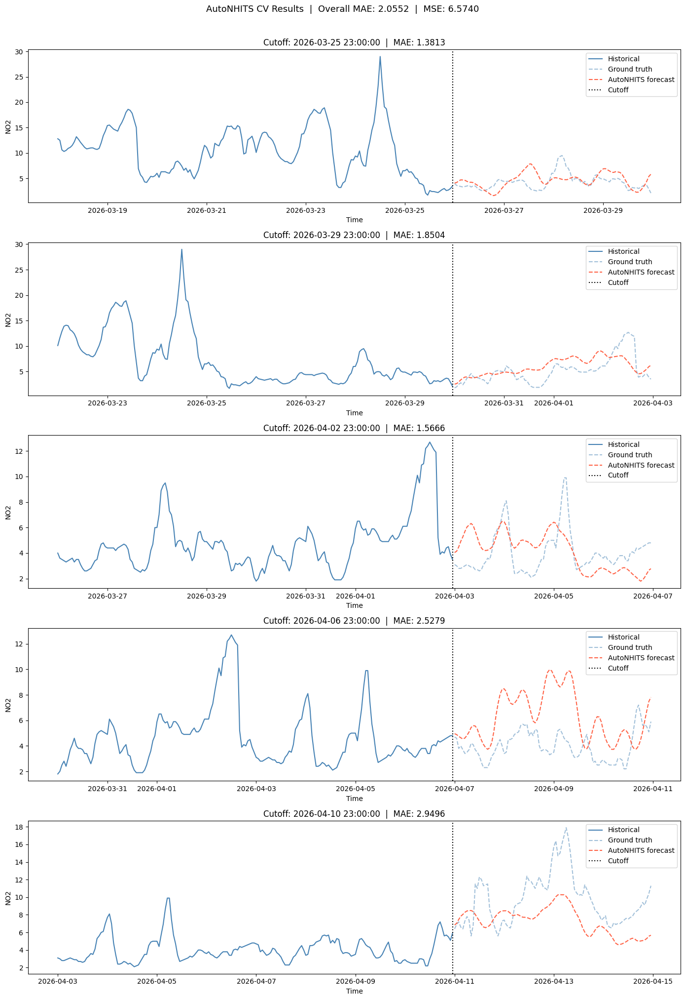

In [13]:
best_config = run_model_test('PM2.5', ['temperature', 'wind_speed'], train_df, step_size=96, w_size=5)

(_train_tune pid=29457) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29457) Seed set to 7
(_train_tune pid=29457) GPU available: True (mps), used: True
(_train_tune pid=29457) TPU available: False, using: 0 TPU cores
(_train_tune pid=29457) 
(_train_tune pid=29457)   | Name         | Type          | Params | Mode 
(_train_tune pid=29457) -------------------------------------------------------
(_train_tune pid=29457) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29457) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29457) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29457) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=29457)

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 26.60it/s, v_num=0, train_loss_step=12.30, train_loss_epoch=12.50]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 24.77it/s, v_num=0, train_loss_step=6.050, train_loss_epoch=6.420, valid_loss=3.800]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.75it/s, v_num=0, train_loss_step=4.570, train_loss_epoch=4.360, valid_loss=3.520]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 100.30it/s]
(_train_tune pid=29457) 
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 24.58it/s, v_num=0, train_loss_step=3.620, train_loss_epoch=3.300, valid_loss=3.680]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|

(_train_tune pid=29457) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29492) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29492) Seed set to 9
(_train_tune pid=29492) GPU available: True (mps), used: True
(_train_tune pid=29492) TPU available: False, using: 0 TPU cores
(_train_tune pid=29492) 
(_train_tune pid=29492)   | Name         | Type          | Params | Mode 
(_train_tune pid=29492) -------------------------------------------------------
(_train_tune pid=29492) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29492) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29492) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29492) 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 25.20it/s, v_num=0, train_loss_step=13.70, train_loss_epoch=14.90]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 26.59it/s, v_num=0, train_loss_step=9.100, train_loss_epoch=9.500, valid_loss=3.570]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.11it/s, v_num=0, train_loss_step=6.400, train_loss_epoch=7.100, valid_loss=3.480]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 26.41it/s, v_num=0, train_loss_step=5.520, train_loss_epoch=5.370, valid_loss=3.600]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 20.62it/s, v_num=0, train_loss

(_train_tune pid=29492) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29514) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29514) Seed set to 3
(_train_tune pid=29514) GPU available: True (mps), used: True
(_train_tune pid=29514) TPU available: False, using: 0 TPU cores
(_train_tune pid=29514) 
(_train_tune pid=29514)   | Name         | Type          | Params | Mode 
(_train_tune pid=29514) -------------------------------------------------------
(_train_tune pid=29514) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29514) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29514) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29514) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 18.36it/s, v_num=0, train_loss_step=30.90, train_loss_epoch=28.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 28.74it/s, v_num=0, train_loss_step=35.30, train_loss_epoch=36.90, valid_loss=4.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.22it/s, v_num=0, train_loss_step=30.10, train_loss_epoch=24.80, valid_loss=4.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.07it/s, v_num=0, train_loss_step=25.00, train_loss_epoch=29.00, valid_loss=4.540]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29514) 
Epoch 499: 100%|██████████| 1/1 [00:00<

(_train_tune pid=29514) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29536) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29536) Seed set to 3
(_train_tune pid=29536) GPU available: True (mps), used: True
(_train_tune pid=29536) TPU available: False, using: 0 TPU cores
(_train_tune pid=29536) 
(_train_tune pid=29536)   | Name         | Type          | Params | Mode 
(_train_tune pid=29536) -------------------------------------------------------
(_train_tune pid=29536) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29536) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29536) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29536) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 21.27it/s, v_num=0, train_loss_step=10.70, train_loss_epoch=10.80]
(_train_tune pid=29536) 
Validation: |          | 0/? [00:00<?, ?it/s]
(_train_tune pid=29536) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29536) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 24.72it/s, v_num=0, train_loss_step=6.440, train_loss_epoch=6.690, valid_loss=3.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.30it/s, v_num=0, train_loss_step=4.350, train_loss_epoch=3.900, valid_loss=4.110]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.34it/s, v_num=0, train_loss_step=3.250, train_loss_epoch=3.120, valid_loss=4.090]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00

(_train_tune pid=29536) `Trainer.fit` stopped: `max_steps=2000` reached.


(_train_tune pid=29536) 
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 16.61it/s, v_num=0, train_loss_step=0.977, train_loss_epoch=0.977, valid_loss=3.850]


(_train_tune pid=29589) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29589) Seed set to 3
(_train_tune pid=29589) GPU available: True (mps), used: True
(_train_tune pid=29589) TPU available: False, using: 0 TPU cores


Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=29589) 
(_train_tune pid=29589)   | Name         | Type          | Params | Mode 
(_train_tune pid=29589) -------------------------------------------------------
(_train_tune pid=29589) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29589) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29589) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29589) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=29589) 4 | blocks       | ModuleList    | 10.0 M | train
(_train_tune pid=29589) -------------------------------------------------------
(_train_tune pid=29589) 10.0 M    Trainable params
(_train_tune pid=29589) 0         Non-trainable params
(_train_tune pid=29589) 10.0 M    Total params
(_train_tune pid=29589) 40.006    Total estimated model params size (MB)
(_train_tune pid=29589) 122       Modules in train mode
(_train_tune pid=29589) 0         Modules in eval mode
(_train_tune pid=29589) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 21.75it/s, v_num=0, train_loss_step=26.80, train_loss_epoch=25.10]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 27.60it/s, v_num=0, train_loss_step=24.60, train_loss_epoch=23.00, valid_loss=4.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.25it/s, v_num=0, train_loss_step=21.30, train_loss_epoch=18.20, valid_loss=4.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.23it/s, v_num=0, train_loss_step=17.40, train_loss_epoch=15.50, valid_loss=4.320]
(_train_tune pid=29589) 
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29589) 
Epoch 499: 100

(_train_tune pid=29589) `Trainer.fit` stopped: `max_steps=2000` reached.
Seed set to 3


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 23.71it/s, v_num=0, train_loss_step=5.110, train_loss_epoch=5.700, valid_loss=3.890]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 14.82it/s, v_num=0, train_loss_step=5.110, train_loss_epoch=5.110, valid_loss=3.940]
                                                                           

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 86.10it/s] 
RMSE: 4.5553


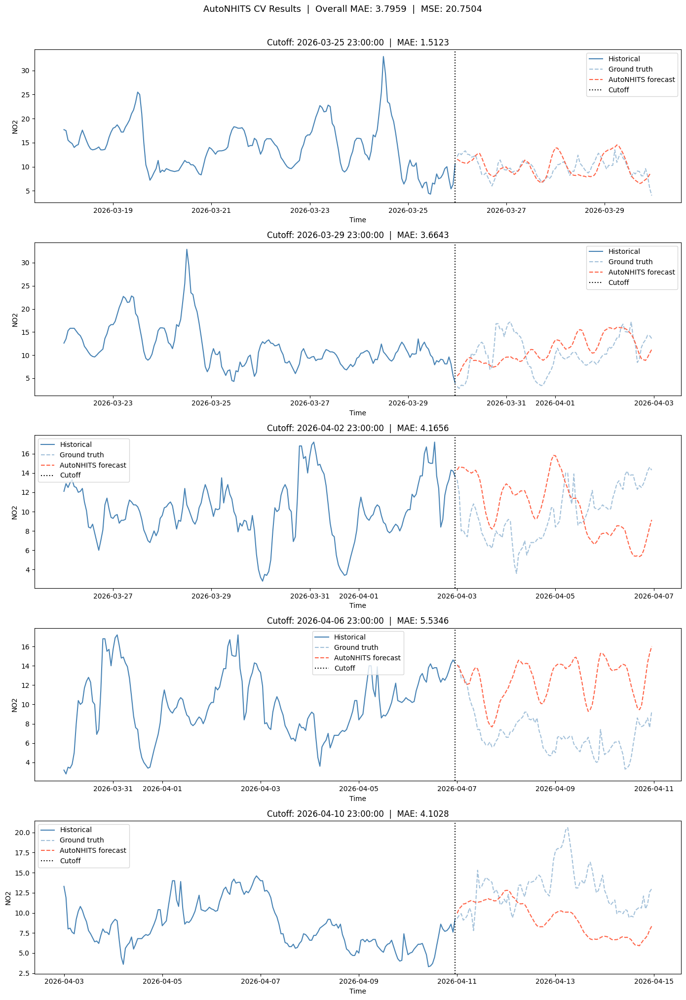

In [14]:
best_config = run_model_test('PM10', ['temperature', 'wind_speed'], train_df, step_size=96, w_size=5)

In [16]:
PM_config = {
        "learning_rate": tune.loguniform(1e-4, 1e-2), # step size for learning rate optimizer
        "max_steps": tune.choice([2000]), # number of gradient steps (??)
        "input_size": tune.choice([7*24]),  # 8 days vs 28 days lookback period
        "batch_size": tune.choice([1]), # just 1 since i only have one time series
        "windows_batch_size": tune.choice([256]), # number of windows sampled from the series per training step
        "n_pool_kernel_size": tune.choice([[4, 2, 1]]), # maxpool kernel size
        "n_freq_downsample": tune.choice([[4,2,1], [2,1,1]]),   # coarse/medium/fine decomposition aligned to 96h horizon
        #[24, 4, 1],    # daily cycle emphasis, # controls interpolation ratio when projecting each stack's output back up to the horizon
        "dropout_prob_theta": tune.choice([0.2, 0.3, 0.4]), # dropout, regularization to the MLP output
        "activation": tune.choice(["ReLU"]), # activation function used in the mlp units
        "n_blocks": tune.choice([[3, 3, 3]]), # number of blocks per stack
        "mlp_units": tune.choice([[[512, 512], [512, 512], [512, 512]]]), # size of MLP units (one pair per stack)
        "interpolation_mode": tune.choice(["linear"]), # how the coefficents from MLP are interpolated to the full horizon length again
        "val_check_steps": tune.choice([100]), # how often to evaluate on the validation set during training (??)
        "random_seed": tune.randint(1, 10) # vary random seet to reduce risk of lucky/unlucky init
    }

(_train_tune pid=29797) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29797) Seed set to 1
(_train_tune pid=29797) GPU available: True (mps), used: True
(_train_tune pid=29797) TPU available: False, using: 0 TPU cores


Sanity Checking DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]


(_train_tune pid=29797) 
(_train_tune pid=29797)   | Name         | Type          | Params | Mode 
(_train_tune pid=29797) -------------------------------------------------------
(_train_tune pid=29797) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29797) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29797) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29797) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=29797) 4 | blocks       | ModuleList    | 10.1 M | train
(_train_tune pid=29797) -------------------------------------------------------
(_train_tune pid=29797) 10.1 M    Trainable params
(_train_tune pid=29797) 0         Non-trainable params
(_train_tune pid=29797) 10.1 M    Total params
(_train_tune pid=29797) 40.449    Total estimated model params size (MB)
(_train_tune pid=29797) 122       Modules in train mode
(_train_tune pid=29797) 0         Modules in eval mode
(_train_tune pid=29797) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 15.76it/s, v_num=0, train_loss_step=13.80, train_loss_epoch=14.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29797) 
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.78it/s]
(_train_tune pid=29797) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 23.58it/s, v_num=0, train_loss_step=8.180, train_loss_epoch=9.400, valid_loss=4.020]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.07it/s, v_num=0, train_loss_step=6.500, train_loss_epoch=6.530, valid_loss=4.180]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 21.97it/s, v_num=0, train_loss_step=5.620, train_loss_epoch=5.660, valid_loss=3.730]
Validation: |          | 0/? [00:00

(_train_tune pid=29797) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29848) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29848) Seed set to 3
(_train_tune pid=29848) GPU available: True (mps), used: True
(_train_tune pid=29848) TPU available: False, using: 0 TPU cores
(_train_tune pid=29848) 
(_train_tune pid=29848)   | Name         | Type          | Params | Mode 
(_train_tune pid=29848) -------------------------------------------------------
(_train_tune pid=29848) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29848) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29848) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29848) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 25.81it/s, v_num=0, train_loss_step=30.90, train_loss_epoch=28.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29848) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 16.74it/s, v_num=0, train_loss_step=35.30, train_loss_epoch=36.90, valid_loss=4.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.22it/s, v_num=0, train_loss_step=30.10, train_loss_epoch=24.80, valid_loss=4.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 26.42it/s, v_num=0, train_loss_step=25.00, train_loss_epoch=29.00, valid_loss=4.540]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<

(_train_tune pid=29848) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=29931) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29931) Seed set to 3
(_train_tune pid=29931) GPU available: True (mps), used: True
(_train_tune pid=29931) TPU available: False, using: 0 TPU cores
(_train_tune pid=29931) 
(_train_tune pid=29931)   | Name         | Type          | Params | Mode 
(_train_tune pid=29931) -------------------------------------------------------
(_train_tune pid=29931) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29931) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29931) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29931) 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 15.36it/s, v_num=0, train_loss_step=13.70, train_loss_epoch=14.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=29931) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 25.98it/s, v_num=0, train_loss_step=9.110, train_loss_epoch=8.590, valid_loss=3.980]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 26.11it/s, v_num=0, train_loss_step=6.800, train_loss_epoch=6.140, valid_loss=3.680]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.63it/s, v_num=0, train_loss_step=5.530, train_loss_epoch=5.090, valid_loss=3.700]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:0

(_train_tune pid=29931) `Trainer.fit` stopped: `max_steps=2000` reached.


(_train_tune pid=29931) 
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 16.87it/s, v_num=0, train_loss_step=1.960, train_loss_epoch=1.960, valid_loss=3.920]


(_train_tune pid=29994) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=29994) Seed set to 1
(_train_tune pid=29994) GPU available: True (mps), used: True
(_train_tune pid=29994) TPU available: False, using: 0 TPU cores


Epoch 0:   0%|          | 0/1 [00:00<?, ?it/s]                             


(_train_tune pid=29994) 
(_train_tune pid=29994)   | Name         | Type          | Params | Mode 
(_train_tune pid=29994) -------------------------------------------------------
(_train_tune pid=29994) 0 | loss         | MSE           | 0      | train
(_train_tune pid=29994) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=29994) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=29994) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=29994) 4 | blocks       | ModuleList    | 10.0 M | train
(_train_tune pid=29994) -------------------------------------------------------
(_train_tune pid=29994) 10.0 M    Trainable params
(_train_tune pid=29994) 0         Non-trainable params
(_train_tune pid=29994) 10.0 M    Total params
(_train_tune pid=29994) 40.006    Total estimated model params size (MB)
(_train_tune pid=29994) 122       Modules in train mode
(_train_tune pid=29994) 0         Modules in eval mode
(_train_tune pid=29994) /Users/lou

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 27.45it/s, v_num=0, train_loss_step=12.90, train_loss_epoch=11.80]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 25.14it/s, v_num=0, train_loss_step=6.740, train_loss_epoch=7.850, valid_loss=3.810]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.04it/s, v_num=0, train_loss_step=4.430, train_loss_epoch=4.820, valid_loss=3.640]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 27.42it/s, v_num=0, train_loss_step=3.660, train_loss_epoch=3.520, valid_loss=3.540]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 26.44it/s, v_num=0, train_loss_step=3.020, train_loss_epoch=3.080, valid_loss=3.7

(_train_tune pid=29994) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=30031) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=30031) Seed set to 8
(_train_tune pid=30031) GPU available: True (mps), used: True
(_train_tune pid=30031) TPU available: False, using: 0 TPU cores
(_train_tune pid=30031) 
(_train_tune pid=30031)   | Name         | Type          | Params | Mode 
(_train_tune pid=30031) -------------------------------------------------------
(_train_tune pid=30031) 0 | loss         | MSE           | 0      | train
(_train_tune pid=30031) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=30031) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=30031) 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 22.48it/s, v_num=0, train_loss_step=23.20, train_loss_epoch=22.40]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 96.33it/s]
(_train_tune pid=30031) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 23.42it/s, v_num=0, train_loss_step=16.60, train_loss_epoch=19.10, valid_loss=4.480]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 104.74it/s]
(_train_tune pid=30031) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 23.64it/s, v_num=0, train_loss_step=17.10, train_loss_epoch=19.00, valid_loss=4.710]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 25.22it/s, v_num=0, train_loss_step=15.50, train_loss_epoch=

(_train_tune pid=30031) `Trainer.fit` stopped: `max_steps=2000` reached.
Seed set to 1


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 31.63it/s, v_num=0, train_loss_step=7.930, train_loss_epoch=7.810, valid_loss=3.940]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 19.17it/s, v_num=0, train_loss_step=7.930, train_loss_epoch=7.930, valid_loss=4.040]
                                                                           

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 90.88it/s] 
RMSE: 4.6010


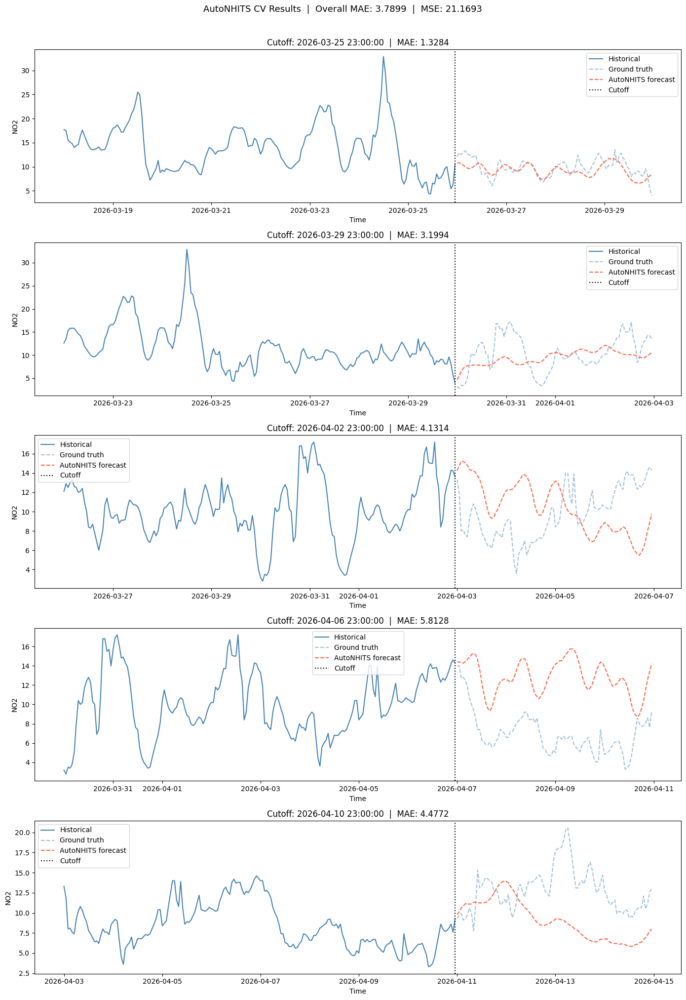

In [17]:
best_config = run_model_test('PM10', ['temperature', 'wind_speed'], PM_config, train_df, step_size=96, w_size=5)

In [ ]:
# ── Config ────────────────────────────────────────────────────────────────────
horizon = 96          # forecast 96 hours ahead
num_samples = 5       # number of Ray Tune trials (5 times, it randomly selects a combination of these values)

nhits_config = {
    "learning_rate": tune.loguniform(1e-4, 1e-2), # step size for learning rate optimizer
    "max_steps": tune.choice([2000]), # number of gradient steps (??)
    "input_size": tune.choice([7*24]),  # 8 days vs 28 days lookback period
    "batch_size": tune.choice([1]), # just 1 since i only have one time series
    "windows_batch_size": tune.choice([256]), # number of windows sampled from the series per training step
    "n_pool_kernel_size": tune.choice([[4, 2, 1]]), # maxpool kernel size
    "n_freq_downsample": tune.choice([
[4, 2, 1],   # coarse/medium/fine decomposition aligned to 96h horizon
    #[24, 4, 1],    # daily cycle emphasis
]), # controls interpolation ratio when projecting each stack's output back up to the horizon
    "dropout_prob_theta": tune.choice([0.2]), # dropout, regularization to the MLP output
    "activation": tune.choice(["ReLU"]), # activation function used in the mlp units
    "n_blocks": tune.choice([[3, 3, 3]]), # number of blocks per stack
    "mlp_units": tune.choice([[[512, 512], [512, 512], [512, 512]]]), # size of MLP units (one pair per stack)
    "interpolation_mode": tune.choice(["linear"]), # how the coefficents from MLP are interpolated to the full horizon length again
    "val_check_steps": tune.choice([100]), # how often to evaluate on the validation set during training (??)
    "random_seed": tune.randint(1, 10), # vary random seet to reduce risk of lucky/unlucky init
    "futr_exog_list": tune.choice([['wind_speed', 'temperature']])
}

In [19]:
df = df.rename(columns={'Recorded': 'ds', 'NO2': 'y'})
df['unique_id'] = 'NO2'

In [16]:
df

,ds,y,O3,PM10,PM2.5,wind_speed,temperature,solar_radiation,precipitation,humidity,unique_id
0,2025-04-18 00:00:00,3.4,90.0,3.8,2.9,4.52,8.3,0.0,0.0,86,NO2
1,2025-04-18 01:00:00,3.1,91.0,3.2,2.6,4.51,7.9,0.0,0.0,87,NO2
2,2025-04-18 02:00:00,2.5,95.0,3.0,2.1,4.40,7.8,0.0,0.0,86,NO2
3,2025-04-18 03:00:00,2.7,92.0,3.1,2.0,4.44,7.8,0.0,0.0,91,NO2
4,2025-04-18 04:00:00,2.6,87.0,3.4,2.6,4.70,7.8,0.0,0.0,89,NO2
...,...,...,...,...,...,...,...,...,...,...,...
8779,2026-04-18 19:00:00,9.9,72.0,12.1,10.4,2.17,9.2,47.0,0.3,92,NO2
8780,2026-04-18 20:00:00,10.7,67.0,11.6,10.4,1.90,9.3,20.0,0.2,93,NO2
8781,2026-04-18 21:00:00,11.6,58.0,11.5,10.4,1.96,9.1,1.0,0.1,94,NO2
8782,2026-04-18 22:00:00,10.7,51.0,11.7,10.6,2.08,9.1,0.0,0.0,95,NO2


In [20]:
no2 = df[['ds', 'unique_id', 'y', 'wind_speed', 'temperature']]

#no2 = df[['ds', 'unique_id', 'y']]

test_size = 96
train_df = no2.iloc[:-test_size]
test_df  = no2.iloc[-test_size:]

In [21]:
# test without stepwise forward selection first:
from neuralforecast.losses.pytorch import MSE

exog_variables = ['wind_speed', 'temperature']

model = AutoNHITS(
    h=horizon,
    loss=MSE(),
    valid_loss=MAE(),
    config=nhits_config,
    num_samples=num_samples,
    refit_with_val=True
)
nf = NeuralForecast(models=[model], freq="h")

#cv_df = nf.cross_validation(df=train_df, val_size=200, test_size=200, step_size=96, n_windows=None)
cv_df = nf.cross_validation(df=train_df, n_windows=5,
                            step_size=horizon, refit=False)

mae = np.mean(np.abs(cv_df["AutoNHITS"] - cv_df["y"]))
mse = np.mean((cv_df["AutoNHITS"] - cv_df["y"]) ** 2)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse:.4f}")

(_train_tune pid=24640) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=24640) Seed set to 7
(_train_tune pid=24640) GPU available: True (mps), used: True
(_train_tune pid=24640) TPU available: False, using: 0 TPU cores
(_train_tune pid=24640) 
(_train_tune pid=24640)   | Name         | Type          | Params | Mode 
(_train_tune pid=24640) -------------------------------------------------------
(_train_tune pid=24640) 0 | loss         | MSE           | 0      | train
(_train_tune pid=24640) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=24640) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=24640) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=24640)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 22.42it/s, v_num=0, train_loss_step=6.530, train_loss_epoch=6.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 83.33it/s]
(_train_tune pid=24640) 
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 23.57it/s, v_num=0, train_loss_step=3.900, train_loss_epoch=3.590, valid_loss=2.970]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 27.42it/s, v_num=0, train_loss_step=2.290, train_loss_epoch=2.280, valid_loss=2.700]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 26.23it/s, v_num=0, train_loss_step=1.810, train_loss_epoch=1.730, valid_loss=2.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0

(_train_tune pid=24640) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=24672) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=24672) Seed set to 9
(_train_tune pid=24672) GPU available: True (mps), used: True
(_train_tune pid=24672) TPU available: False, using: 0 TPU cores
(_train_tune pid=24672) 
(_train_tune pid=24672)   | Name         | Type          | Params | Mode 
(_train_tune pid=24672) -------------------------------------------------------
(_train_tune pid=24672) 0 | loss         | MSE           | 0      | train
(_train_tune pid=24672) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=24672) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=24672) 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 26.44it/s, v_num=0, train_loss_step=8.180, train_loss_epoch=8.850]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 26.81it/s, v_num=0, train_loss_step=5.660, train_loss_epoch=5.230, valid_loss=3.090]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 117.90it/s]
(_train_tune pid=24672) 
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 25.39it/s, v_num=0, train_loss_step=4.140, train_loss_epoch=4.010, valid_loss=2.560]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 28.33it/s, v_num=0, train_loss_step=3.330, train_loss_epoch=2.990, valid_loss=2.590]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 

(_train_tune pid=24672) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=24687) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=24687) Seed set to 3
(_train_tune pid=24687) GPU available: True (mps), used: True
(_train_tune pid=24687) TPU available: False, using: 0 TPU cores
(_train_tune pid=24687) 
(_train_tune pid=24687)   | Name         | Type          | Params | Mode 
(_train_tune pid=24687) -------------------------------------------------------
(_train_tune pid=24687) 0 | loss         | MSE           | 0      | train
(_train_tune pid=24687) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=24687) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=24687) 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]
Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 27.66it/s, v_num=0, train_loss_step=39.90, train_loss_epoch=39.20]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 115.66it/s]
                                                                       
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 26.19it/s, v_num=0, train_loss_step=21.00, train_loss_epoch=30.50, valid_loss=3.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 28.33it/s, v_num=0, train_loss_step=27.20, train_loss_epoch=23.80, valid_loss=3.630]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 122.13it/s]
(_train_tune pid=24687) 
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 24.84it/s, v

(_train_tune pid=24687) `Trainer.fit` stopped: `max_steps=2000` reached.


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 20.85it/s, v_num=0, train_loss_step=20.90, train_loss_epoch=22.20, valid_loss=3.640]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 14.52it/s, v_num=0, train_loss_step=20.90, train_loss_epoch=20.90, valid_loss=3.630]


(_train_tune pid=24709) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=24709) Seed set to 3
(_train_tune pid=24709) GPU available: True (mps), used: True
(_train_tune pid=24709) TPU available: False, using: 0 TPU cores
(_train_tune pid=24709) 
(_train_tune pid=24709)   | Name         | Type          | Params | Mode 
(_train_tune pid=24709) -------------------------------------------------------
(_train_tune pid=24709) 0 | loss         | MSE           | 0      | train
(_train_tune pid=24709) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=24709) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=24709) 3 | scaler       | TemporalNorm  | 0      | train
(_train_tune pid=24709)

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 26.74it/s, v_num=0, train_loss_step=7.250, train_loss_epoch=7.940]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 28.47it/s, v_num=0, train_loss_step=3.300, train_loss_epoch=3.630, valid_loss=2.710]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 27.32it/s, v_num=0, train_loss_step=2.590, train_loss_epoch=3.150, valid_loss=2.480]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 20.48it/s, v_num=0, train_loss_step=1.990, train_loss_epoch=1.950, valid_loss=2.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=24709) 
Epoch 499: 100%|██████████| 1/1 [00:00<

(_train_tune pid=24709) `Trainer.fit` stopped: `max_steps=2000` reached.
(_train_tune pid=24730) /Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/ray/tune/integration/pytorch_lightning.py:198: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=24730) Seed set to 3
(_train_tune pid=24730) GPU available: True (mps), used: True
(_train_tune pid=24730) TPU available: False, using: 0 TPU cores
(_train_tune pid=24730) 
(_train_tune pid=24730)   | Name         | Type          | Params | Mode 
(_train_tune pid=24730) -------------------------------------------------------
(_train_tune pid=24730) 0 | loss         | MSE           | 0      | train
(_train_tune pid=24730) 1 | valid_loss   | MAE           | 0      | train
(_train_tune pid=24730) 2 | padder_train | ConstantPad1d | 0      | train
(_train_tune pid=24730) 

Epoch 99: 100%|██████████| 1/1 [00:00<00:00, 25.09it/s, v_num=0, train_loss_step=22.30, train_loss_epoch=19.30]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 199: 100%|██████████| 1/1 [00:00<00:00, 27.13it/s, v_num=0, train_loss_step=12.10, train_loss_epoch=16.10, valid_loss=2.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 299: 100%|██████████| 1/1 [00:00<00:00, 28.54it/s, v_num=0, train_loss_step=13.10, train_loss_epoch=12.40, valid_loss=2.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 399: 100%|██████████| 1/1 [00:00<00:00, 27.30it/s, v_num=0, train_loss_step=12.20, train_loss_epoch=13.00, valid_loss=2.160]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Epoch 499: 100%|██████████| 1/1 [00:00<00:00, 30.01it/s, v_num=0, train_loss_step=11.20, train_loss_epoch=10.80, valid_loss=2.0

(_train_tune pid=24730) `Trainer.fit` stopped: `max_steps=2000` reached.
2026-05-20 16:49:41,990	INFO tune.py:1001 -- Wrote the latest version of all result files and experiment state to '/Users/louisebrixpilegaardhansen/ray_results/_train_tune_2026-05-20_16-42-19' in 0.0056s.
Seed set to 7


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 28.66it/s, v_num=0, train_loss_step=6.990, train_loss_epoch=7.490, valid_loss=2.120]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]
(_train_tune pid=24730) 
Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 17.71it/s, v_num=0, train_loss_step=6.990, train_loss_epoch=6.990, valid_loss=2.250]


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | eval 
1 | valid_loss   | MAE           | 0      | eval 
2 | padder_train | ConstantPad1d | 0      | train
3 | scaler       | TemporalNorm  | 0      | train
4 | blocks       | ModuleList    | 10.0 M | train
-------------------------------------------------------
10.0 M    Trainable params
0         Non-trainable params
10.0 M    Total params
40.006    Total estimated model params size (MB)
120       Modules in train mode
2         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/Users/louisebrixpilegaardhansen/Uni/DataScience/air-quality-forecasting/.venv/lib/python3.14/site-packages/pytorch_lightning/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 15.61it/s, v_num=0, train_loss_step=0.613, train_loss_epoch=0.613, valid_loss=1.920]

`Trainer.fit` stopped: `max_steps=2000` reached.


Epoch 1999: 100%|██████████| 1/1 [00:00<00:00, 15.22it/s, v_num=0, train_loss_step=0.613, train_loss_epoch=0.613, valid_loss=1.920]


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]
RMSE: 1.8195


In [18]:
loaded_df = pd.read_csv(os.path.join('aarhus_air_quality.csv'))

In [23]:
type(loaded_df['temperature'].iloc[0])

numpy.float64

In [24]:
loaded_df['Recorded'] = pd.to_datetime(loaded_df['Recorded'])

In [25]:
type(loaded_df['Recorded'].iloc[0])

pandas._libs.tslibs.timestamps.Timestamp

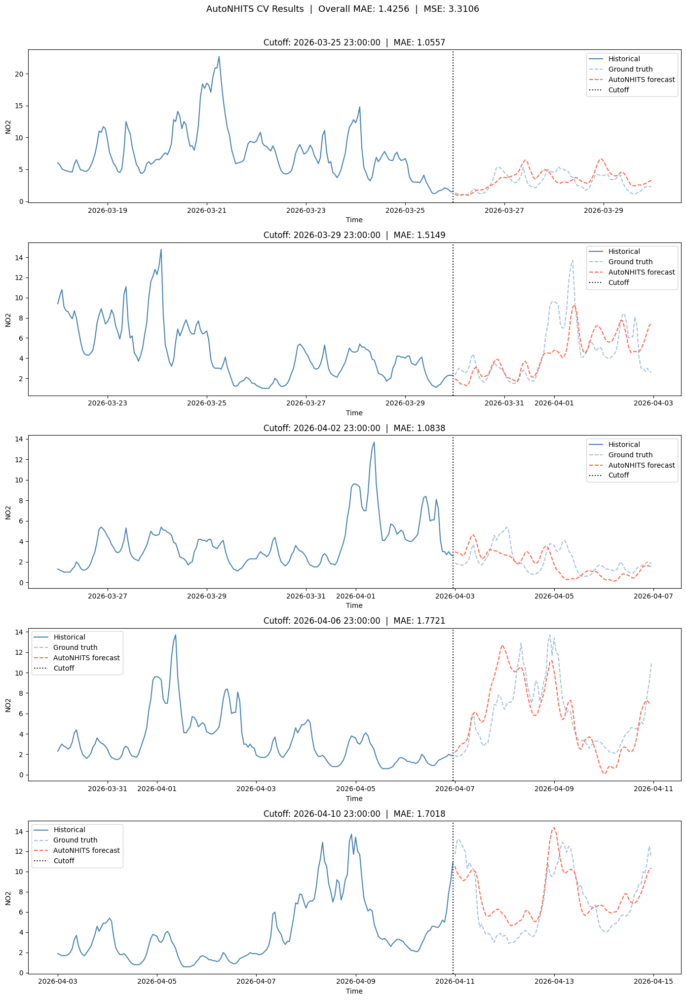

In [22]:
import matplotlib.pyplot as plt

cutoffs = cv_df["cutoff"].unique()

fig, axes = plt.subplots(len(cutoffs), 1, figsize=(14, 4 * len(cutoffs)))

for ax, cutoff in zip(axes, cutoffs):
    window_df = cv_df[cv_df["cutoff"] == cutoff].copy()
    
    # Plot a bit of training context before the cutoff
    context_df = train_df[train_df["ds"] > cutoff - pd.Timedelta(hours=horizon*2)]
    context_df = context_df[context_df["ds"] <= cutoff]
    
    ax.plot(context_df["ds"], context_df["y"], 
            color="steelblue", label="Historical")
    ax.plot(window_df["ds"], window_df["y"], 
            color="steelblue", linestyle="--", alpha=0.5, label="Ground truth")
    ax.plot(window_df["ds"], window_df["AutoNHITS"], 
            color="tomato", linestyle="--", label="AutoNHITS forecast")
    ax.axvline(x=cutoff, color="black", linestyle=":", label="Cutoff")
    
    window_mae = np.mean(np.abs(window_df["AutoNHITS"] - window_df["y"]))
    ax.set_title(f"Cutoff: {cutoff}  |  MAE: {window_mae:.4f}")
    ax.set_xlabel("Time")
    ax.set_ylabel("NO2")
    ax.legend()

plt.suptitle(f"AutoNHITS CV Results  |  Overall MAE: {mae:.4f}  |  MSE: {mse:.4f}", 
             fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

In [23]:
best_config = nf.models[0].results.get_best_result().config
print(best_config)

{'learning_rate': 0.0010559497443981645, 'max_steps': 2000, 'input_size': 168, 'batch_size': 1, 'windows_batch_size': 256, 'n_pool_kernel_size': [4, 2, 1], 'n_freq_downsample': [4, 2, 1], 'dropout_prob_theta': 0.2, 'activation': 'ReLU', 'n_blocks': [3, 3, 3], 'mlp_units': [[512, 512], [512, 512], [512, 512]], 'interpolation_mode': 'linear', 'val_check_steps': 100, 'random_seed': 7, 'futr_exog_list': ['wind_speed', 'temperature'], 'h': 96, 'loss': MSE(), 'valid_loss': MAE()}


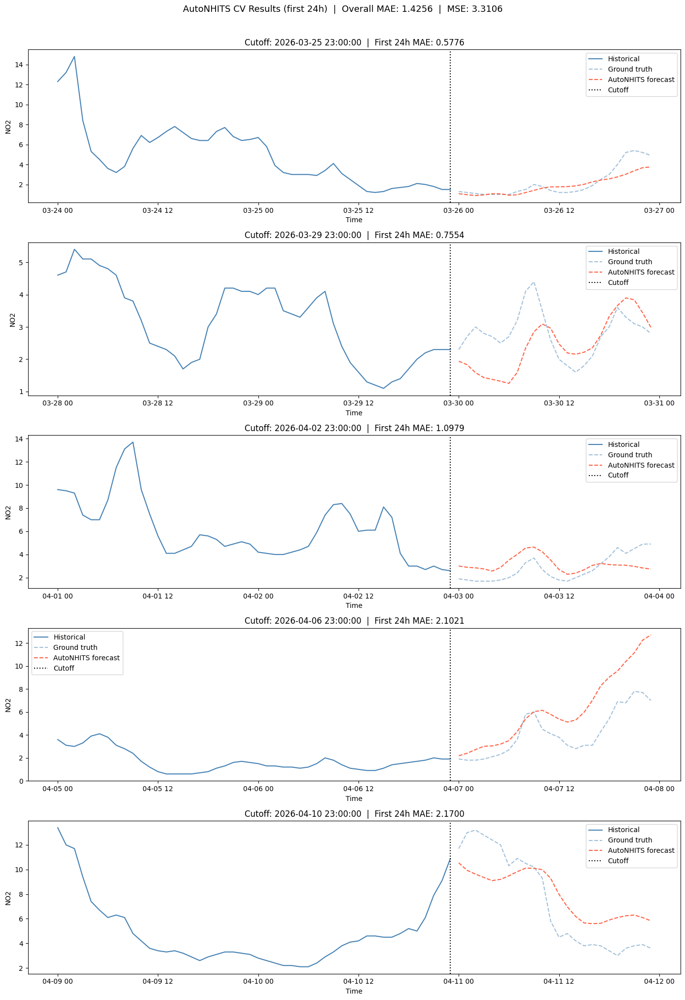

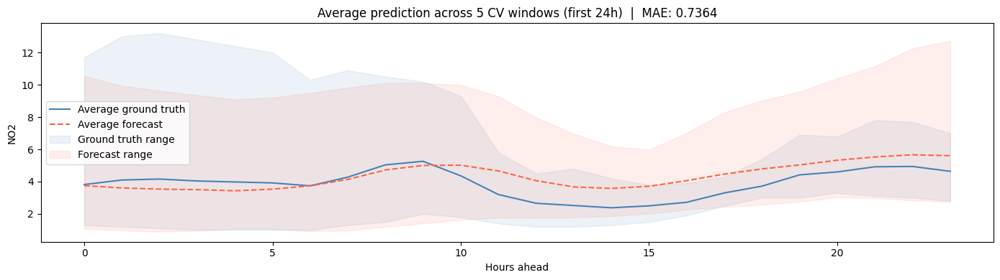

In [24]:
import matplotlib.pyplot as plt

cutoffs = cv_df["cutoff"].unique()

# ── Per-window plots (zoomed to first 24 hours) ────────────────────────────────
fig, axes = plt.subplots(len(cutoffs), 1, figsize=(14, 4 * len(cutoffs)))

for ax, cutoff in zip(axes, cutoffs):
    window_df = cv_df[cv_df["cutoff"] == cutoff].copy()
    window_df = window_df.iloc[:24]  # zoom to first 24 hours
    
    context_df = train_df[train_df["ds"] > cutoff - pd.Timedelta(hours=48)]
    context_df = context_df[context_df["ds"] <= cutoff]
    
    ax.plot(context_df["ds"], context_df["y"],
            color="steelblue", label="Historical")
    ax.plot(window_df["ds"], window_df["y"],
            color="steelblue", linestyle="--", alpha=0.5, label="Ground truth")
    ax.plot(window_df["ds"], window_df["AutoNHITS"],
            color="tomato", linestyle="--", label="AutoNHITS forecast")
    ax.axvline(x=cutoff, color="black", linestyle=":", label="Cutoff")
    
    window_mae = np.mean(np.abs(window_df["AutoNHITS"] - window_df["y"]))
    ax.set_title(f"Cutoff: {cutoff}  |  First 24h MAE: {window_mae:.4f}")
    ax.set_xlabel("Time")
    ax.set_ylabel("NO2")
    ax.legend()

plt.suptitle(f"AutoNHITS CV Results (first 24h)  |  Overall MAE: {mae:.4f}  |  MSE: {mse:.4f}",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# ── Average prediction across all windows for first 24 hours ──────────────────
fig, ax = plt.subplots(figsize=(14, 4))

all_true = []
all_pred = []

for cutoff in cutoffs:
    window_df = cv_df[cv_df["cutoff"] == cutoff].copy()
    all_true.append(window_df["y"].values[:24])
    all_pred.append(window_df["AutoNHITS"].values[:24])

avg_true = np.mean(all_true, axis=0)
avg_pred = np.mean(all_pred, axis=0)
hours = np.arange(24)

ax.plot(hours, avg_true, color="steelblue", label="Average ground truth")
ax.plot(hours, avg_pred, color="tomato", linestyle="--", label="Average forecast")
ax.fill_between(hours,
                np.min(all_true, axis=0), np.max(all_true, axis=0),
                alpha=0.1, color="steelblue", label="Ground truth range")
ax.fill_between(hours,
                np.min(all_pred, axis=0), np.max(all_pred, axis=0),
                alpha=0.1, color="tomato", label="Forecast range")

avg_mae = np.mean(np.abs(avg_pred - avg_true))
ax.set_title(f"Average prediction across {len(cutoffs)} CV windows (first 24h)  |  MAE: {avg_mae:.4f}")
ax.set_xlabel("Hours ahead")
ax.set_ylabel("NO2")
ax.legend()
plt.tight_layout()
plt.show()

### Seasonal Naive baseline

In [27]:
test_df['y'] # these are the values we want to predict

# we use the value 24 hours ago to predict the current value

# for the first prediction in the test set, we need to use data from the train df

y_before_test = train_df['y'][-24:]

repeats = 4 # 24*4=96


import numpy as np

def lag24_predict(y_before_test, horizon=96, lag=24):
    last_cycle = np.array(y_before_test[-lag:])
    repeats = 4
    return np.tile(last_cycle, repeats)[:horizon]

y_pred = lag24_predict(y_before_test)

mae  = np.mean(np.abs(test_df['y'] - y_pred))
rmse = np.sqrt(np.mean((test_df['y'] - y_pred) ** 2))

print({"MAE": mae, "RMSE": rmse})

{'MAE': np.float64(4.863541666666666), 'RMSE': np.float64(6.709919584714361)}


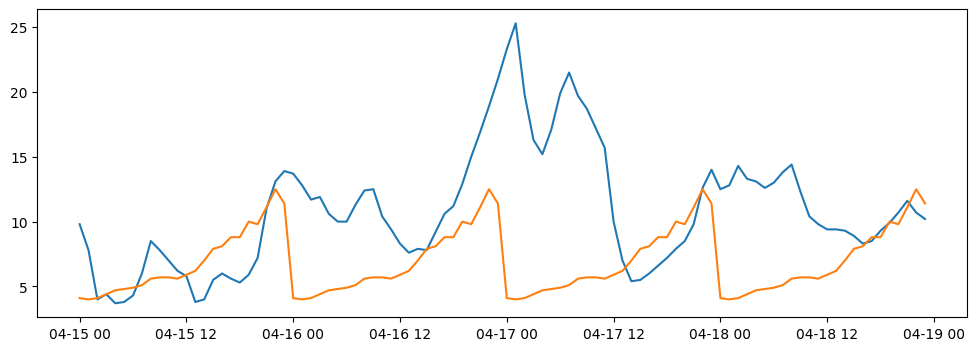

In [29]:
plt.figure(figsize=(12, 4))
plt.plot(test_df['ds'], test_df['y'], label="Actual")
plt.plot(test_df['ds'], y_pred, label="Lag-24 Baseline")